In [ ]:
# Welcome to your new notebook
# Type here in the cell editor to add code!


In [1]:
df = spark.sql("SELECT * FROM MNIST_Lakehouse.`mnist`")
display(df)

StatementMeta(, bfab747b-7fc7-4132-855c-0c5f442accb8, 3, Finished, Available)

SynapseWidget(Synapse.DataFrame, 7b06337d-4dbb-454b-8197-4bf785ed7231)

In [2]:
import pandas as pd  
import numpy as np  
from matplotlib import pyplot as plt  


StatementMeta(, bfab747b-7fc7-4132-855c-0c5f442accb8, 4, Finished, Available)

In [6]:
#move column 'label' to the beginning
df = df[['label'] + [col for col in df.columns if col != 'label']]
display(df)

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 8, Finished, Available)

SynapseWidget(Synapse.DataFrame, e2c01b30-dc6a-414d-a033-5bbe73e02c84)

In [16]:
from pyspark.sql.functions import col
df2 = df.select([col(column).cast('int') for column in df.columns])
df2.printSchema()

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 18, Finished, Available)

root
 |-- label: integer (nullable = true)
 |-- 0: integer (nullable = true)
 |-- 1: integer (nullable = true)
 |-- 2: integer (nullable = true)
 |-- 3: integer (nullable = true)
 |-- 4: integer (nullable = true)
 |-- 5: integer (nullable = true)
 |-- 6: integer (nullable = true)
 |-- 7: integer (nullable = true)
 |-- 8: integer (nullable = true)
 |-- 9: integer (nullable = true)
 |-- 10: integer (nullable = true)
 |-- 11: integer (nullable = true)
 |-- 12: integer (nullable = true)
 |-- 13: integer (nullable = true)
 |-- 14: integer (nullable = true)
 |-- 15: integer (nullable = true)
 |-- 16: integer (nullable = true)
 |-- 17: integer (nullable = true)
 |-- 18: integer (nullable = true)
 |-- 19: integer (nullable = true)
 |-- 20: integer (nullable = true)
 |-- 21: integer (nullable = true)
 |-- 22: integer (nullable = true)
 |-- 23: integer (nullable = true)
 |-- 24: integer (nullable = true)
 |-- 25: integer (nullable = true)
 |-- 26: integer (nullable = true)
 |-- 27: integer (null

In [17]:
df2.write.mode('overwrite').format("delta").saveAsTable("mnist_cleaned")


StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 19, Finished, Available)

In [19]:
data = df2.toPandas()
data.to_csv("/lakehouse/default/Files/mnist.csv")
data.head()

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 21, Finished, Available)

,label,0,1,2,3,4,5,6,7,8,...,774,775,776,777,778,779,780,781,782,783
0,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [20]:
data.dtypes

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 22, Finished, Available)

label    int32
0        int32
1        int32
2        int32
3        int32
         ...  
779      int32
780      int32
781      int32
782      int32
783      int32
Length: 785, dtype: object

In [21]:
data = data.astype(int)
data.dtypes

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 23, Finished, Available)

label    int64
0        int64
1        int64
2        int64
3        int64
         ...  
779      int64
780      int64
781      int64
782      int64
783      int64
Length: 785, dtype: object

In [22]:
data=np.array(data)  
m, n = data.shape 
print("m, n", m, n)  
np.random.shuffle(data)  

data_dev=data[0:1000].T 
Y_dev = data_dev[0]
X_dev = data_dev[1:n]
X_dev = X_dev / 255. 

data_train=data[1000:m].T
Y_train = data_train[0]
X_train = data_train[1:n]
X_train = X_train / 255. 
_,m_train = X_train.shape

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 24, Finished, Available)

m, n 70000 785


In [23]:
data[:100]

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 25, Finished, Available)

array([[8, 0, 0, ..., 0, 0, 0],
       [6, 0, 0, ..., 0, 0, 0],
       [9, 0, 0, ..., 0, 0, 0],
       ...,
       [9, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0]])

In [24]:
data_dev[:100]

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 26, Finished, Available)

array([[  8,   6,   9, ...,   2,   7,   6],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0, 102],
       [  0,   0,   0, ...,   0,   0, 253],
       [  0,   0,   0, ...,   0,   0, 252]])

In [25]:
Y_dev[:900]

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 27, Finished, Available)

array([8, 6, 9, 7, 2, 9, 1, 4, 3, 9, 4, 6, 0, 2, 9, 8, 6, 3, 1, 6, 5, 6,
       6, 5, 8, 5, 8, 2, 5, 0, 8, 3, 0, 2, 4, 9, 5, 9, 3, 8, 7, 5, 9, 2,
       7, 0, 9, 1, 1, 0, 3, 5, 8, 3, 9, 4, 9, 8, 3, 8, 3, 9, 5, 8, 3, 7,
       8, 0, 1, 3, 7, 1, 3, 1, 9, 4, 8, 1, 6, 4, 4, 5, 5, 4, 8, 3, 9, 7,
       4, 3, 9, 3, 6, 0, 1, 2, 2, 9, 1, 1, 9, 7, 5, 1, 2, 3, 5, 3, 5, 3,
       3, 6, 3, 7, 6, 5, 0, 5, 8, 0, 0, 0, 7, 2, 3, 3, 0, 0, 5, 0, 6, 6,
       2, 8, 9, 0, 6, 8, 7, 1, 6, 7, 3, 7, 2, 7, 6, 0, 7, 8, 3, 4, 5, 0,
       7, 8, 8, 2, 4, 2, 1, 1, 4, 0, 5, 5, 8, 9, 0, 8, 2, 7, 6, 6, 5, 7,
       3, 2, 0, 3, 7, 3, 1, 0, 0, 2, 2, 1, 6, 4, 7, 9, 4, 6, 4, 5, 0, 0,
       4, 2, 4, 0, 1, 0, 2, 7, 5, 9, 5, 1, 2, 2, 6, 1, 0, 3, 8, 0, 0, 1,
       5, 1, 6, 1, 0, 7, 7, 6, 6, 4, 4, 6, 9, 1, 2, 7, 3, 8, 2, 7, 5, 2,
       9, 3, 8, 0, 3, 3, 9, 8, 6, 1, 9, 5, 9, 0, 9, 0, 6, 1, 3, 0, 1, 8,
       1, 1, 1, 4, 7, 3, 7, 4, 2, 1, 9, 6, 1, 2, 8, 3, 2, 0, 6, 5, 1, 1,
       6, 1, 3, 4, 7, 1, 5, 0, 9, 2, 0, 8, 1, 5, 9,

In [26]:
X_dev[:100]


StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 28, Finished, Available)

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.99215686],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.98823529],
       [0.        , 0.44705882, 0.        , ..., 0.        , 0.        ,
        0.32156863]])

In [27]:
X_train[:, 0].shape

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 29, Finished, Available)

(784,)

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 38, Finished, Available)

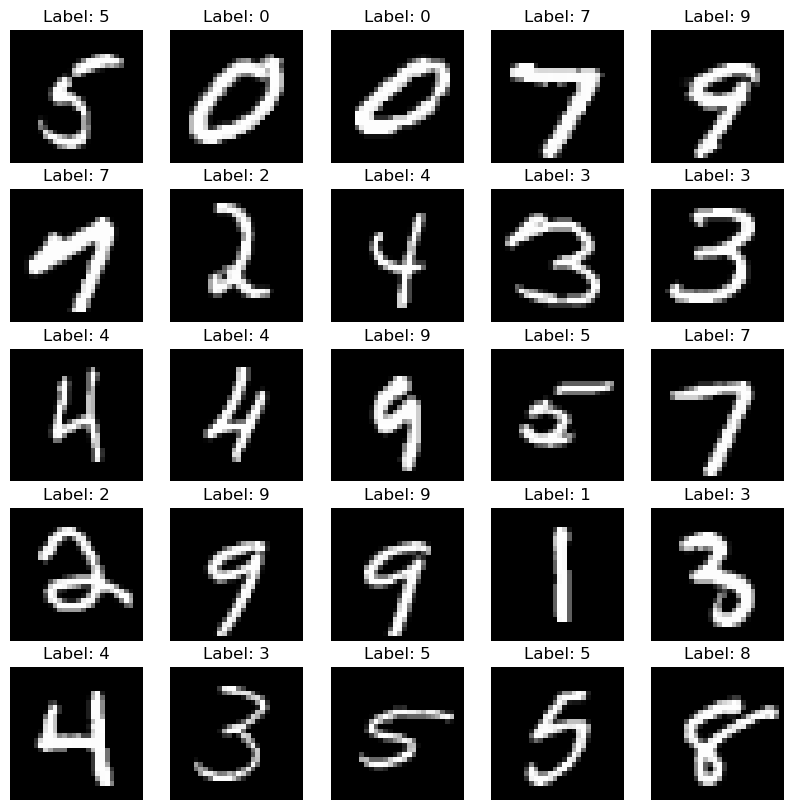

In [36]:
import random
plt.figure(figsize=(10, 10))
random_img = random.sample(range(len(X_train)), 25)
for i, idx in enumerate(random_img):
    plt.subplot(5, 5, i + 1)
    current_image = X_train[:, i, None]
    current_image = current_image.reshape((28, 28))*255
    plt.imshow(current_image, cmap='gray')
    plt.title(f'Label: {Y_train[i]}')
    plt.axis('off')
plt.show()

In [47]:
def init_params():
    W1 = np.random.rand(10, 784) - 0.5
    b1 = np.random.rand(10, 1) - 0.5
    W2 = np.random.rand(10, 10) - 0.5
    b2 = np.random.rand(10, 1) - 0.5
    return W1, b1, W2, b2 

def ReLU(Z):
    return np.maximum(Z, 0)

def softmax(Z):
    A2 = np.exp(Z) / sum(np.exp(Z))
    return A2

def forward_prop(W1, b1, W2, b2, X):
    Z1 = W1.dot(X) + b1
    A1 = ReLU(Z1)
    Z2 = W2.dot(A1) + b2 
    A2 = softmax(Z2)
    return Z1, A1, Z2, A2 

def one_hot(Y):
    one_hot_Y = np.zeros((Y.size, Y.max() + 1)) 
    one_hot_Y[np.arange(Y.size), Y] = 1
    one_hot_Y = one_hot_Y.T
    return one_hot_Y

def deriv_ReLU(Z):
    return Z > 0

def back_prop(Z1, A1, Z2, A2, W2, X, Y):
    one_hot_Y = one_hot(Y)
    dZ2 = A2 - one_hot_Y
    dW2 = 1 / m * dZ2.dot(A1.T)
    db2 = 1 / m * np.sum(dZ2)
    dZ1 = W2.T.dot(dZ2) * deriv_ReLU(Z1)
    dW1 = 1 / m * dZ1.dot(X.T)
    db1 = 1 / m * np.sum(dZ1)
    return dW1, db1, dW2, db2 

def update_params(W1, b1, W2, b2, dW1, db1, dW2, db2, alpha):
    W1 = W1 - alpha * dW1
    b1 = b1 - alpha * db1
    W2 = W2 - alpha * dW2 
    b2 = b2 - alpha * db2 
    return W1, b1, W2, b2 

def get_predictions(A2):
    return np.argmax(A2, 0)

def get_accuracy(predictions, Y):
    print(predictions, Y)
    return np.sum(predictions ==Y) /Y.size

def gradient_descent(X, Y, iterations, alpha):
    W1, b1, W2, b2 = init_params()
    for i in range(iterations):
        Z1, A1, Z2, A2 = forward_prop(W1,b1,W2,b2,X)
        dW1, db1, dW2, db2 = back_prop(Z1, A1, Z2, A2, W2, X, Y)
        W1, b1, W2, b2 = update_params(W1, b1, W2, b2, dW1, db1, dW2, db2, alpha)
        if i % 10 == 0:
            print("Iteration: ", i)
            print("Accuracy: ", get_accuracy(get_predictions(A2), Y))
    return W1, b1, W2, b2 

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 49, Finished, Available)

In [48]:
W1, b1, W2, b2 = gradient_descent(X_train, Y_train, 500, 0.1)

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 50, Finished, Available)

Iteration:  0
[7 5 5 ... 7 5 7] [5 0 0 ... 6 2 6]
Accuracy:  0.06365217391304348
Iteration:  10
[7 3 0 ... 6 4 7] [5 0 0 ... 6 2 6]
Accuracy:  0.18979710144927536
Iteration:  20
[7 0 0 ... 6 4 7] [5 0 0 ... 6 2 6]
Accuracy:  0.26620289855072465
Iteration:  30
[7 0 0 ... 6 4 6] [5 0 0 ... 6 2 6]
Accuracy:  0.3625217391304348
Iteration:  40
[7 0 0 ... 6 4 6] [5 0 0 ... 6 2 6]
Accuracy:  0.417231884057971
Iteration:  50
[7 0 0 ... 6 4 6] [5 0 0 ... 6 2 6]
Accuracy:  0.4562898550724638
Iteration:  60
[7 0 0 ... 6 2 6] [5 0 0 ... 6 2 6]
Accuracy:  0.49330434782608695
Iteration:  70
[7 0 0 ... 6 2 6] [5 0 0 ... 6 2 6]
Accuracy:  0.5286231884057971
Iteration:  80
[7 0 0 ... 6 2 6] [5 0 0 ... 6 2 6]
Accuracy:  0.5594782608695652
Iteration:  90
[5 0 0 ... 6 2 6] [5 0 0 ... 6 2 6]
Accuracy:  0.5877246376811595
Iteration:  100
[5 0 0 ... 6 2 6] [5 0 0 ... 6 2 6]
Accuracy:  0.6128115942028985
Iteration:  110
[5 0 0 ... 6 2 6] [5 0 0 ... 6 2 6]
Accuracy:  0.6355652173913043
Iteration:  120
[5 0 0 .

In [49]:
def make_predictions(X, W1, b1, W2, b2):
    _,_,_,A2 = forward_prop(W1, b1, W2, b2, X)
    predictions = get_predictions(A2) 
    return predictions 

def test_prediction(index, W1, b1, W2, b2):
    current_image = X_train[:, index, None]
    prediction = make_predictions(current_image, W1, b1, W2, b2)
    label = Y_train[index]
    print("Prediciton: ", prediction)
    print("Label: ", label)

    current_image = current_image.reshape((28, 28)) * 255
    plt.gray()
    plt.imshow(current_image, interpolation='nearest')
    plt.show()

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 51, Finished, Available)

StatementMeta(, d3ad79e2-bd35-453d-96ed-e3136b40b5d2, 53, Finished, Available)

Prediciton:  [5]
Label:  5


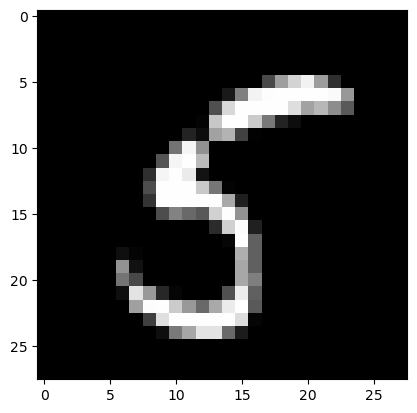

Prediciton:  [4]
Label:  4


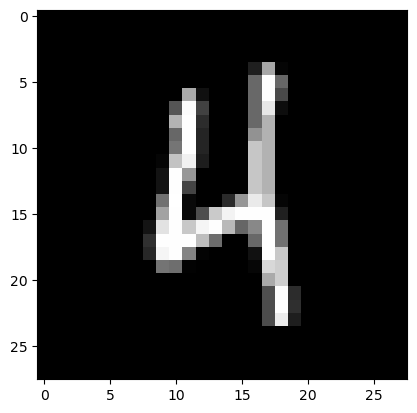

Prediciton:  [7]
Label:  7


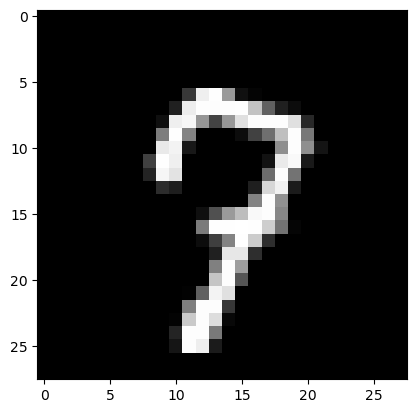

In [51]:
test_prediction(0, W1, b1, W2, b2)
test_prediction(10, W1, b1, W2, b2)
test_prediction(100, W1, b1, W2, b2)